# InceptionV3 Evaluation on Custom Dataset

This specific version is running on two datasets
1. Twenty percent (20%) subset of group one's WikiArt dataset
2. Group four's complete signals data

The notebook contains a specific structure we will need for all the notebooks when we are submitting the papers. Most of the notebook is generalized and based on multiple notebooks submitted by everyone. Sam and Mac have written a ton of code on generalizing the folder imports and everyone is familiar with that code.

In [1]:
from __future__ import print_function, division

import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
import copy

%matplotlib inline

cudnn.benchmark = True
plt.ion()   # interactive mode


device = None

has_mps = hasattr(torch, 'has_mps') and torch.has_mps

if has_mps:
    device = torch.device('mps')
    print(device+' can be utilized')
elif torch.cuda.is_available():
    device = 'cuda'
    cuda = True
    print(device+' can be utilized')
else:
    device = 'cpu'
    print(device+' can be utilized')


cpu can be utilized


In [2]:
os.getcwd()

'/Users/leonardmarshall/Georgetown_Coursework/677/Labs/Lab 10'

In [10]:
train_image_location = './train/png/'
test_image_location = './test/png/'
results_location = './results/'
description = 'InceptionV3'

mean = [0.4829, 0.4908, 0.4228]
std = [0.2297, 0.2252, 0.2601]

print('Mean of dataset:', mean)
print('Std of dataset:', std)

Mean of dataset: [0.4829, 0.4908, 0.4228]
Std of dataset: [0.2297, 0.2252, 0.2601]


In [14]:
from torchvision.transforms.transforms import CenterCrop
class SquarePad:
    def __call__(self, image):
        max_wh = max(image.size)
        p_left, p_top = [(max_wh - s) // 2 for s in image.size]
        p_right, p_bottom = [max_wh - (s+pad) for s, pad in zip(image.size, [p_left, p_top])]
        padding = (p_left, p_top, p_right, p_bottom)
        return torchvision.transforms.functional.pad(image, padding, 0, 'constant')


data_transforms = {
    'train': transforms.Compose([
            SquarePad(),
            torchvision.transforms.RandomHorizontalFlip(p = 0.5),
            torchvision.transforms.RandomVerticalFlip(p = 0.5),
            torchvision.transforms.Resize((299, 299)),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
            SquarePad(),
            torchvision.transforms.RandomHorizontalFlip(p = 0.5),
            torchvision.transforms.RandomVerticalFlip(p = 0.5),
            torchvision.transforms.Resize((299, 299)),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
}


data_dir  = './'

image_datasets = {
    x: datasets.ImageFolder(os.path.join(data_dir, x),
                                         data_transforms[x])
                  for x in ['train', 'test']
                  }

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=32,
                                             shuffle=True) # add num_workers here if you need
              for x in ['train', 'test']
                  }
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']
                  }
class_names = image_datasets['train'].classes
print(class_names)

['Shotgun', 'Under_Center']


# Visualize a few images

Let's visualize a few training images so as to understand the data augmentations.

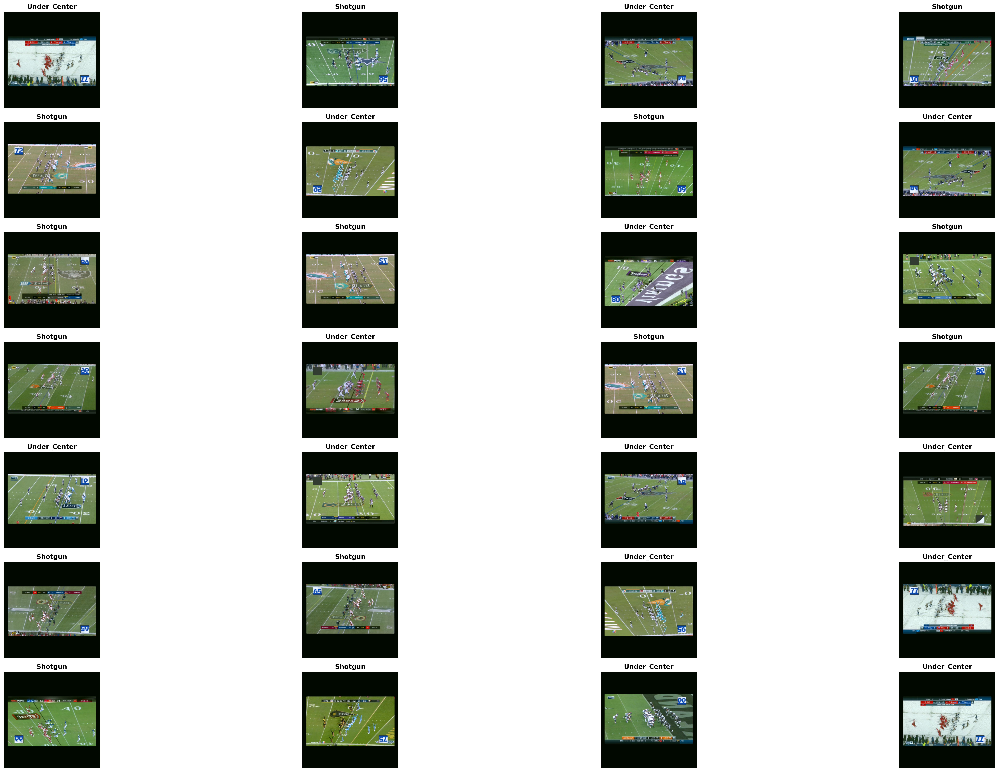

In [15]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(7,4,figsize= (35,20), dpi=300)

for i in range(28):
      inputs, classes = next(iter(dataloaders['train']))
      mean = [0.4829, 0.4908, 0.4228]
      std = [0.2297, 0.2252, 0.2601]
      img = inputs[i].numpy().transpose(1, 2, 0)
      img = np.clip((std * img) + mean, 0, 1)
      axes.flat[i].imshow(img)
      axes.flat[i].set_title(str(class_names[classes[i]]), fontweight='bold')
      [axi.set_axis_off() for axi in axes.ravel()]

fig.tight_layout()
fig.savefig('./data_visualizations/train_signal_image.jpg', dpi=300, bbox_inches='tight')
fig.savefig('./data_visualizations/train_signal_image.pdf', dpi=300, bbox_inches='tight')


# Training the model

Now, let's write a general function to train a model. Here, we will illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from ``torch.optim.lr_scheduler``.

In [16]:
from datetime import datetime
import tqdm as tqdm

num_epochs = 5 #10

pbar = tqdm.tqdm(total=num_epochs, position=0, leave=True, colour='#336699')
pbar.set_description("EPOCH 1: Training Loss: NA, ")

def train_model(model, criterion, optimizer, scheduler, num_epochs=num_epochs):
    since = time.time()
    train_epo_time = []
    train_epo_loss = []
    train_epo_accu = []
    test_epo_time = []
    test_epo_loss = []
    test_epo_accu = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        # print(f'Epoch {epoch}/{num_epochs - 1}')
        # print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        current_loss = loss.cpu().data.item()
                        running_loss += current_loss

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'train':
                train_epo_loss.append(epoch_loss)
                train_epo_accu.append(epoch_acc)
            else:
                test_epo_loss.append(epoch_loss)
                test_epo_accu.append(epoch_acc)

            pbar.set_description(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            # f"EPOCH {epoch+1}\t Batch Loss: {current_loss:.3f}\t  Epoch Loss: {train_loss[-1]:.3f}\t Train Acc: {train_accuracy[-1]:.3f}\t Test Loss: {test_loss[-1]:.3f}\t")
            # deep copy the model
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        pbar.update()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

EPOCH 1: Training Loss: NA, :   0%|                       | 0/5 [00:00<?, ?it/s]

In [17]:
plt.figure(figsize=(10,5), dpi=120)

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(6, 6))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

<Figure size 1200x600 with 0 Axes>

In [19]:
# Use this model parameters if your torch version is 1.12 - My version
model = models.inception_v3() #weights='Inception_V3_Weights.DEFAULT'
model.aux_logits=False
model

/opt/anaconda3/lib/python3.8/site-packages/torchvision/models/inception.py:75: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn('The default weight initialization of inception_v3 will be changed in future releases of '


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [20]:
num_ftrs = model.fc.in_features
# print(num_ftrs)
# Here the size of each output sample is set to 2. In your model use nn.Linear(num_ftrs, len(class_names)) to generalize to your number of classes.
model.fc = nn.Linear(num_ftrs, 27)

model = model.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [21]:
model_fit = train_model(model, criterion, optimizer, exp_lr_scheduler,
                       num_epochs=num_epochs)

test Loss: 1.3622 Acc: 0.7198: 100%|█████████████| 5/5 [25:54<00:00, 279.51s/it]

Training complete in 21m 23s
Best val Acc: 0.719780


# Visualizing the model predictions

Generic function to display predictions for a few images

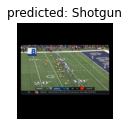

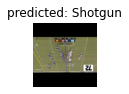

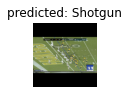

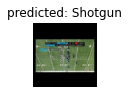

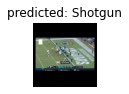

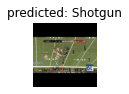

In [22]:
visualize_model(model_fit)

## Finetuning the convnet

Load a pretrained model and reset final fully connected layer. If you run the model and see a warning then you are probabily running torchvision version 1.12.

In [23]:
# Use this model parameters if your torch version is 1.12 - My version
model = models.inception_v3() #weights='Inception_V3_Weights.DEFAULT'
model.aux_logits=False
model

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [24]:

num_ftrs = model.fc.in_features
# print(num_ftrs)
# Here the size of each output sample is set to 2. In your model use nn.Linear(num_ftrs, len(class_names)) to generalize to your number of classes.
model.fc = nn.Linear(num_ftrs, 2)

model_ft = model.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

# Train and evaluate

It should take around 15-25 min on CPU. On GPU though, it takes less than a minute.


In [25]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=num_epochs)

test Loss: 0.7999 Acc: 0.7198: : 10it [1:08:57, 497.05s/it]                     :49<00:00, 279.51s/it]

Training complete in 40m 38s
Best val Acc: 0.719780


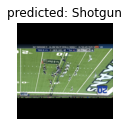

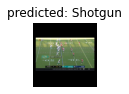

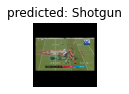

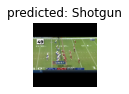

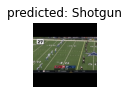

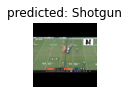

In [26]:
visualize_model(model_ft)

# ConvNet as fixed feature extractor

Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad = False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation [here](https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward)`.


In [27]:
# Torchvision models V 1.11
# model_conv = torchvision.models.inception_v3(pretrained=True)
# Torchvision models V 1.12 - My version
model_conv = torchvision.models.inception_v3() #weights='Inception_V3_Weights.DEFAULT'
model_conv.aux_logits=False


for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

# Train and evaluate

On CPU this will take about half the time compared to previous scenario. This is expected as gradients don't need to be computed for most of the network. However, forward does need to be computed.

In [28]:
model_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=num_epochs)

test Loss: 0.6210 Acc: 0.6923: : 15it [3:29:22, 1669.44s/it]   

Training complete in 136m 51s
Best val Acc: 0.719780


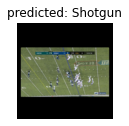

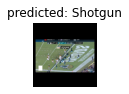

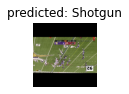

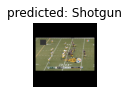

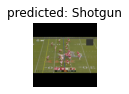

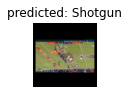

In [29]:
visualize_model(model_conv)

plt.ioff()
plt.show()